# Прекод

# Сборный проект-5

### Введение и цель проекта

Необходимо разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

## 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


In [1]:
import numpy as np
import pandas as pd
import os
import re
import nltk
from nltk.corpus import stopwords as nltk_stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics import mean_squared_error, r2_score
from catboost import CatBoostRegressor
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import ResNet50
from PIL import Image
from pathlib import Path
import zipfile
import os


nltk.download('stopwords') 
nltk.download('punkt')
nltk.download('wordnet')
from nltk.corpus import wordnet

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\MOdinokov\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\MOdinokov\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\MOdinokov\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [2]:
# Загрузка данных
train_df = pd.read_csv(os.path.join('train_dataset.csv'))
crowd_df = pd.read_csv(os.path.join('CrowdAnnotations.tsv'), sep='\t', 
                      header=None, names=["image", "query_id", "part_agree", "sum_agree", "sum_not_agree"])
expert_df = pd.read_csv(os.path.join("ExpertAnnotations.tsv"), sep='\t', 
                        header=None, names=["image", "query_id", "exp1", "exp2", "exp3"])
test_images_df = pd.read_csv(os.path.join("test_images.csv"))
test_queries_df = pd.read_csv(os.path.join("test_queries.csv"), sep='|', index_col=0)

In [ ]:
# для работы в Colab
try:
  # изображения
  train_images_path = '/content/to_upload/train_images'
  test_images_path = '/content/to_upload/test_images'

  # наборы данных
  train_dataset_path = '/content/to_upload/train_dataset.csv'
  crowd_annotations_path  = '/content/to_upload/CrowdAnnotations.tsv'
  expert_annotations_path  = '/content/to_upload/ExpertAnnotations.tsv'
  test_images_df_path = '/content/to_upload/test_images.csv'
  test_queries_df_path = '/content/to_upload/test_queries.csv'

# для работы локально
except:
  # изображения
  train_images_path = '/datasets/image_search/train_images'
  test_images_path = '/datasets/image_search/test_images'

  # наборы данных
  train_dataset_path = '/datasets/image_search/train_dataset.csv'
  crowd_annotations_path  = '/datasets/image_search/CrowdAnnotations.tsv'
  expert_annotations_path  = '/datasets/image_search/ExpertAnnotations.tsv'
  test_images_df_path = '/datasets/image_search/test_images.csv'
  test_queries_df_path = '/datasets/image_search/test_queries.csv'

In [3]:



zip_file_path = 'train_images.zip'

extract_to = 'train_images2'


os.makedirs(extract_to, exist_ok=True)


with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)


In [4]:
path_train_images = "train_images2"
path_test_images = "test_images"

Напишем функцию, которая выведет на экран часть датасета, а также определит пропуски и дубликаты

Прогоним через эту функцию наши датасеты

In [5]:
def explore_dataframe(dataframe):
    display(dataframe.head())
    dataframe.info()
    print('\nНайдено пропусков:')
    print(dataframe.isna().sum())
    print('\nНайдено дубликатов:', dataframe.duplicated().sum())

In [6]:
explore_dataframe(train_df)

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB

Найдено пропусков:
image         0
query_id      0
query_text    0
dtype: int64

Найдено дубликатов: 0


In [7]:
explore_dataframe(crowd_df)

,image,query_id,part_agree,sum_agree,sum_not_agree
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   image          47830 non-null  object 
 1   query_id       47830 non-null  object 
 2   part_agree     47830 non-null  float64
 3   sum_agree      47830 non-null  int64  
 4   sum_not_agree  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB

Найдено пропусков:
image            0
query_id         0
part_agree       0
sum_agree        0
sum_not_agree    0
dtype: int64

Найдено дубликатов: 0


In [8]:
explore_dataframe(expert_df)

,image,query_id,exp1,exp2,exp3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   exp1      5822 non-null   int64 
 3   exp2      5822 non-null   int64 
 4   exp3      5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB

Найдено пропусков:
image       0
query_id    0
exp1        0
exp2        0
exp3        0
dtype: int64

Найдено дубликатов: 0


In [9]:
explore_dataframe(test_images_df)

,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 928.0+ bytes

Найдено пропусков:
image    0
dtype: int64

Найдено дубликатов: 0


In [10]:
explore_dataframe(test_queries_df)

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


<class 'pandas.core.frame.DataFrame'>
Int64Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB

Найдено пропусков:
query_id      0
query_text    0
image         0
dtype: int64

Найдено дубликатов: 0


Вывод: пропуски и явные дубликаты в данных не найдены

Теперь просмотрим изображения и для этого напишем функцию. 

In [11]:
def create_image_generator(dataframe, img_path):
    generator = ImageDataGenerator(rescale=1./255)
    return generator.flow_from_dataframe(dataframe=dataframe,
                                          directory=img_path,
                                          x_col='image',
                                          y_col='query_text',
                                          target_size=(224, 224),
                                          batch_size=16,
                                          class_mode='raw',
                                          seed=12345)

In [12]:
def show_images(dataflow):
    images, labels = next(dataflow)
    for label, img in zip(labels[:16], images[:16]):
        plt.figure(figsize=(3,3))
        plt.title(label)
        plt.imshow(img)
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()

Found 5822 validated image filenames.


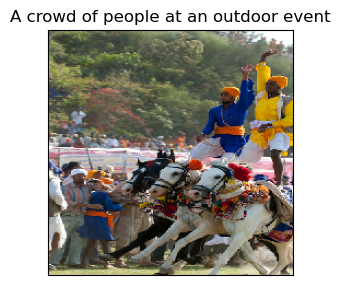

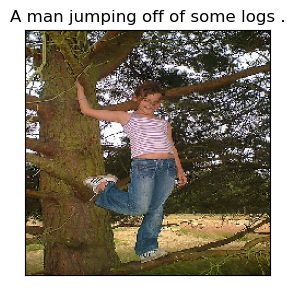

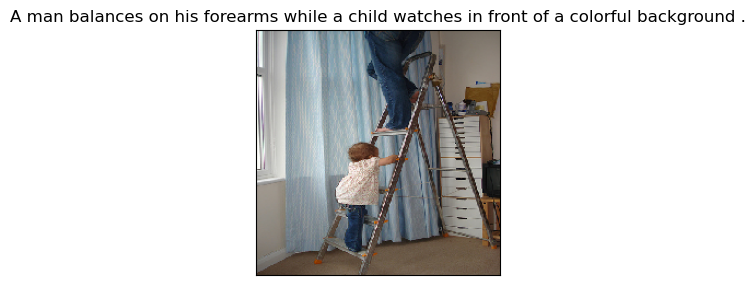

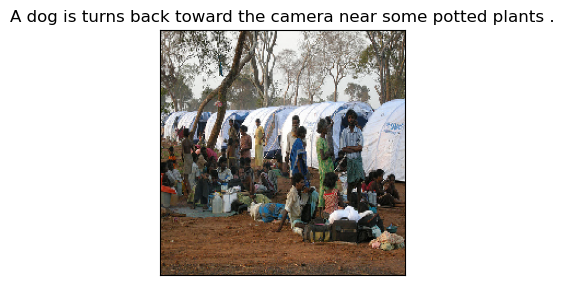

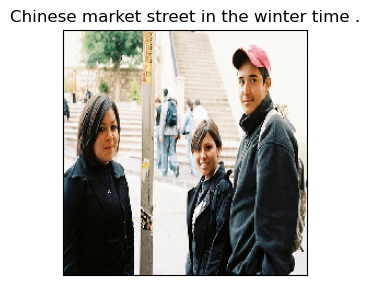

...

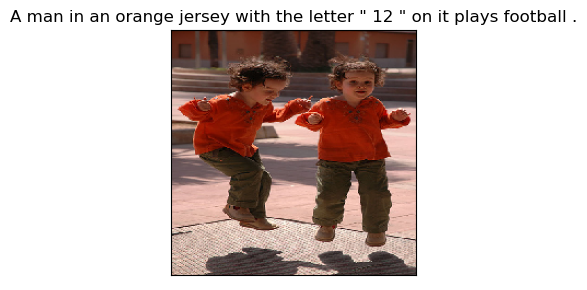

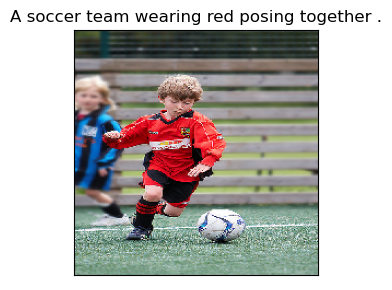

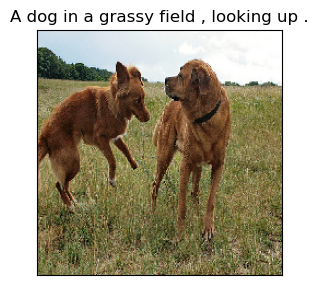

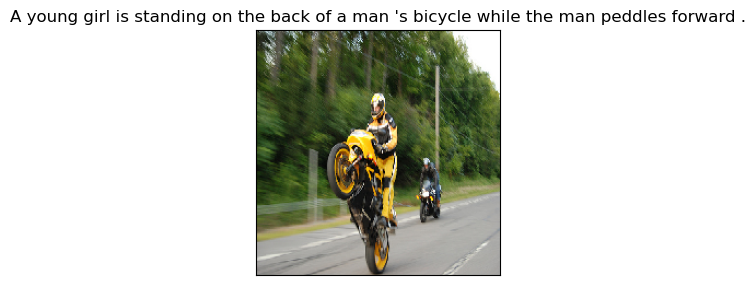

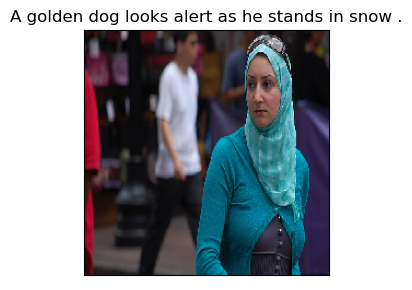

In [13]:
# Просмотр изображений в обучающей выборке
show_images(create_image_generator(train_df, "train_images"))


Found 500 validated image filenames.


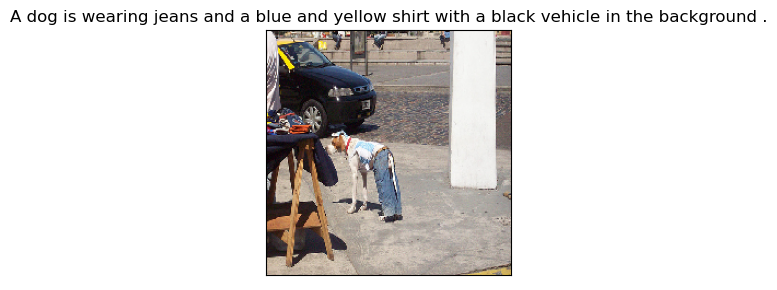

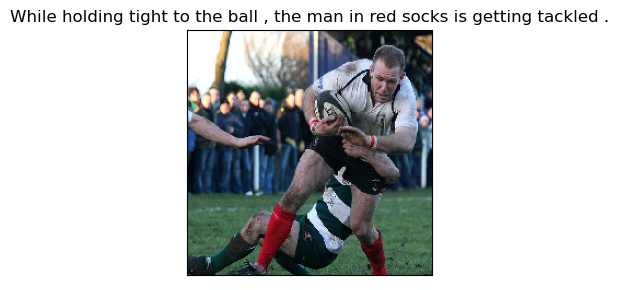

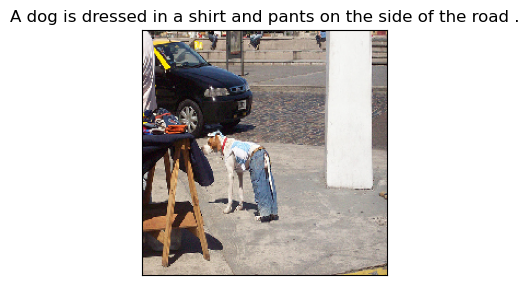

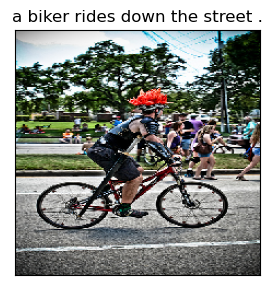

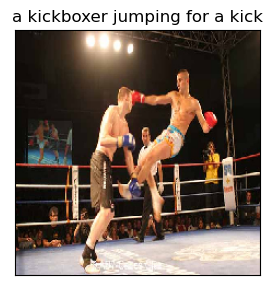

...

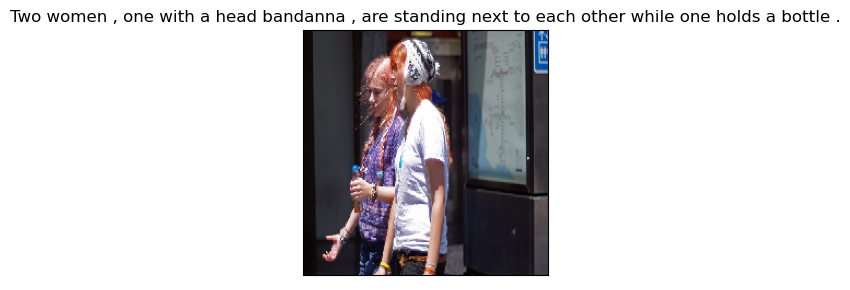

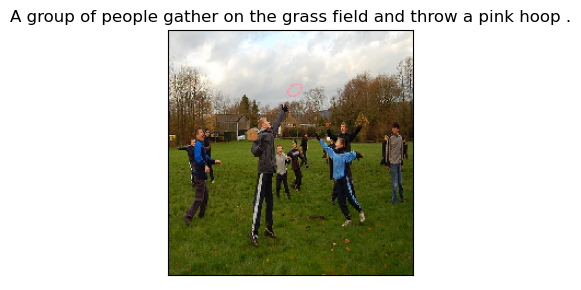

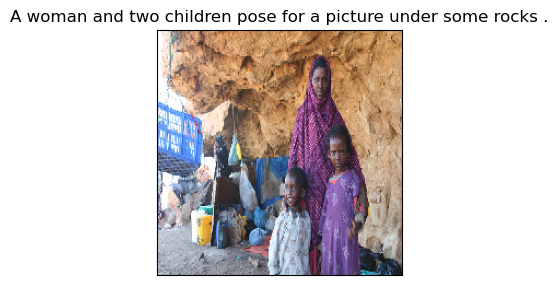

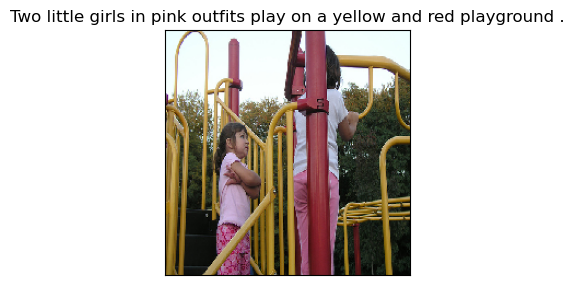

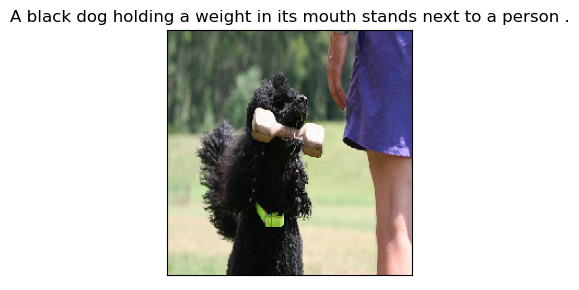

In [14]:
# Просмотр изображений в тестовой выборке
show_images(create_image_generator(test_queries_df, "test_images"))

Далее исследуем экспертные оценки

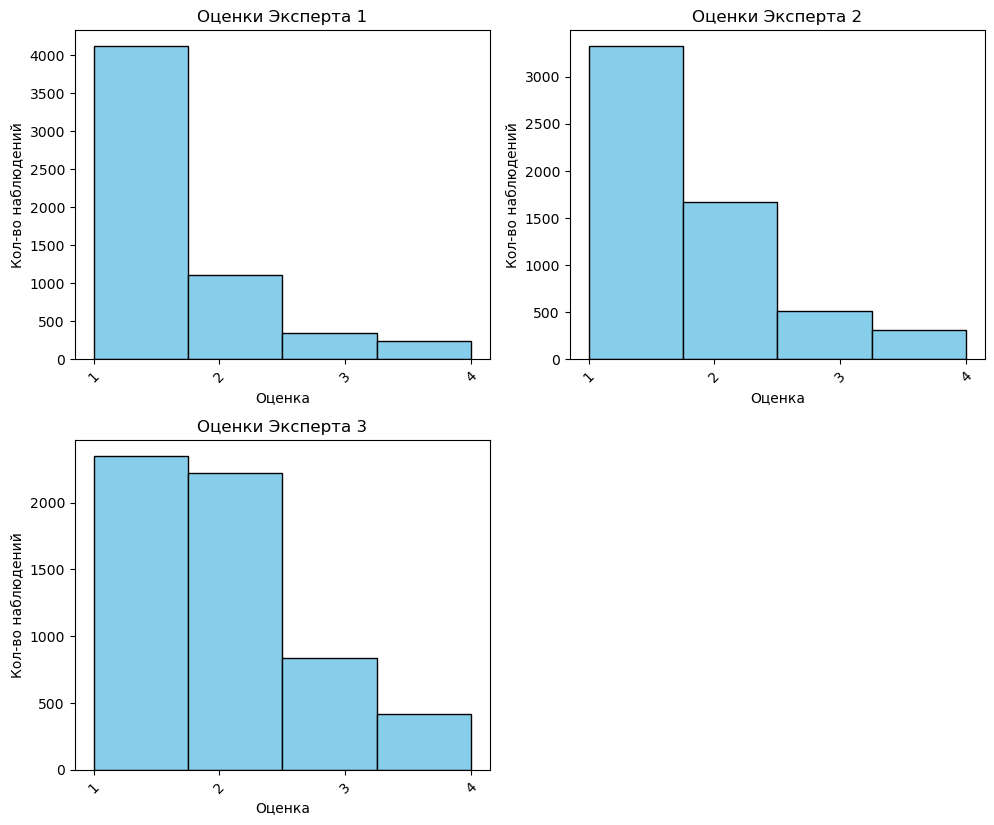

In [15]:
plt.figure(figsize=(15, 12))

x_ticks_exp1 = np.arange(min(expert_df['exp1']), max(expert_df['exp1']) + 1, 1)
x_ticks_exp2 = np.arange(min(expert_df['exp2']), max(expert_df['exp2']) + 1, 1)
x_ticks_exp3 = np.arange(min(expert_df['exp3']), max(expert_df['exp3']) + 1, 1)

plt.subplot(331)
plt.hist(expert_df['exp1'], bins=4, color='skyblue', edgecolor='black')
plt.xlabel('Оценка')
plt.ylabel('Кол-во наблюдений')
plt.title('Оценки Эксперта 1')
plt.xticks(x_ticks_exp1, rotation=45)

plt.subplot(332)
plt.hist(expert_df['exp2'], bins=4, color='skyblue', edgecolor='black')
plt.xlabel('Оценка')
plt.ylabel('Кол-во наблюдений')
plt.title('Оценки Эксперта 2')
plt.xticks(x_ticks_exp2, rotation=45)

plt.subplot(334)
plt.hist(expert_df['exp3'], bins=4, color='skyblue', edgecolor='black')
plt.xlabel('Оценка')
plt.ylabel('Кол-во наблюдений')
plt.title('Оценки Эксперта 3')
plt.xticks(x_ticks_exp3, rotation=45)

plt.tight_layout()
plt.show()

Вывод: 1-й эксперт бОльшую часть своих оценок поставил как самую низкую 1, в то время как другие эксперты оценивали менее жестко.

Но и в целом видно что описания картинок не очень качественные и эксперты ставят довольно низкие оценки

Теперь агрегируем экспертные оценки методом голосования по большинству и для этого напишем функцию ниже. 

Предусмотрим также вариант, если все 3 эксперта дадут отличающиеся оценки, в этом случае поставим пропуск, а потом впоследствии такие наблюдения с пропусками удалим из датасета

In [16]:
# Агрегация экспертных оценок
def aggregate_expert(row):
    if row['exp1'] == row['exp2'] or row['exp1'] == row['exp3']:
        return row['exp1']
    if row['exp2'] == row['exp3']:
        return row['exp2']
    return None

In [17]:
expert_df['agg_exp'] = expert_df.apply(aggregate_expert, axis=1)
expert_df = expert_df.dropna()
expert_df['agg_exp'] = expert_df['agg_exp'].map({1: 0, 2: 0.33*0.6, 3: 0.67*0.6, 4: 0.6})

Также приведем агрегированные экспертные оценки к шкале от 0 до 1. 

Оценку 1 считаем 0, оценку 2 как 0.33, оценку 3 как 0.67, а оценку 4 как 1.

Поскольку в дальнейшем нам нужно будет "поженить" экспертные оценки с краудсорсинговыми (причем по условию задания эксперты получают вес 0.6, а краудсорсинговые оценки вес 0.4), то сразу полученную шкалу умножим еще на вес 0.6

In [18]:
print('Список итоговых оценок экспертов:', expert_df['agg_exp'].sort_values().unique())
print('')
print(expert_df['agg_exp'].value_counts())

Список итоговых оценок экспертов: [0.    0.198 0.402 0.6  ]

0.000    3327
0.198    1566
0.402     492
0.600     311
Name: agg_exp, dtype: int64


По оценке экспертов - более половины изображений не соответствуют описанию!

In [19]:
expert_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5696 entries, 0 to 5821
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image     5696 non-null   object 
 1   query_id  5696 non-null   object 
 2   exp1      5696 non-null   int64  
 3   exp2      5696 non-null   int64  
 4   exp3      5696 non-null   int64  
 5   agg_exp   5696 non-null   float64
dtypes: float64(1), int64(3), object(2)
memory usage: 311.5+ KB


Теперь обработаем краудсорсинговые оценки.


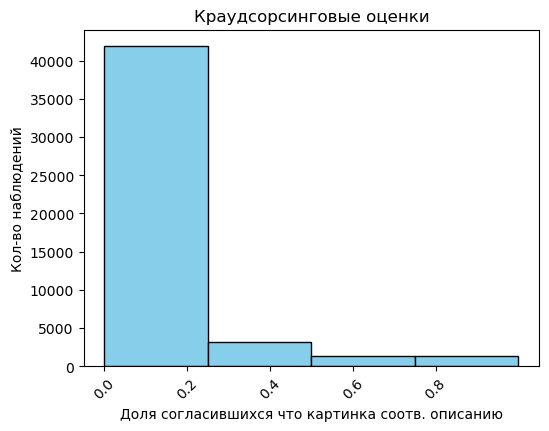

In [20]:
plt.figure(figsize=(15, 12))

x_ticks_cr1 = np.arange(0, 1, 0.2)  # +0.1, чтобы включить 1 в деления

plt.subplot(331)
plt.hist(crowd_df['part_agree'], bins=4, color='skyblue', edgecolor='black')
plt.xlabel('Доля согласившихся что картинка соотв. описанию')
plt.ylabel('Кол-во наблюдений')
plt.title('Краудсорсинговые оценки')
plt.xticks(x_ticks_cr1, rotation=45)  # Используем x_ticks_cr1 для меток по оси X

plt.tight_layout()
plt.show()

Краудсорсинговые оценки также очень низкие

Возьмем долю согласившихся что картинка соответствует описанию и сразу умножим на все 0.4

In [21]:
# Агрегация краудсорсинговых оценок
crowd_df['part_agree'] *= 0.4  

In [22]:
crowd_df

,image,query_id,part_agree,sum_agree,sum_not_agree
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,0.400000,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.000000,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.000000,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.000000,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.000000,0,3
...,...,...,...,...,...
47825,997722733_0cb5439472.jpg,543007912_23fc735b99.jpg#2,0.000000,0,3
47826,997722733_0cb5439472.jpg,544576742_283b65fa0d.jpg#2,0.133333,1,2
47827,997722733_0cb5439472.jpg,872622575_ba1d3632cc.jpg#2,0.400000,3,0
47828,997722733_0cb5439472.jpg,888425986_e4b6c12324.jpg#2,0.000000,0,3


Теперь сформируем итоговую оценку

In [23]:
combined_df = expert_df.merge(crowd_df, on=['image', 'query_id'], how='left')


In [24]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5696 entries, 0 to 5695
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   image          5696 non-null   object 
 1   query_id       5696 non-null   object 
 2   exp1           5696 non-null   int64  
 3   exp2           5696 non-null   int64  
 4   exp3           5696 non-null   int64  
 5   agg_exp        5696 non-null   float64
 6   part_agree     2258 non-null   float64
 7   sum_agree      2258 non-null   float64
 8   sum_not_agree  2258 non-null   float64
dtypes: float64(4), int64(3), object(2)
memory usage: 445.0+ KB


In [25]:
combined_df['part_agree'].fillna(combined_df['part_agree'].median(), inplace=True)

In [26]:

combined_df['target_variable'] = combined_df['agg_exp'] + combined_df['part_agree']


In [27]:
combined_df

,image,query_id,exp1,exp2,exp3,agg_exp,part_agree,sum_agree,sum_not_agree,target_variable
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000,0.000000,0.0,3.0,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.000,0.000000,0.0,3.0,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.000,0.000000,NaN,NaN,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.198,0.000000,NaN,NaN,0.198000
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.000,0.000000,NaN,NaN,0.000000
...,...,...,...,...,...,...,...,...,...,...
5691,997722733_0cb5439472.jpg,2981702521_2459f2c1c4.jpg#2,1,1,1,0.000,0.000000,NaN,NaN,0.000000
5692,997722733_0cb5439472.jpg,2985679744_75a7102aab.jpg#2,1,1,1,0.000,0.000000,0.0,3.0,0.000000
5693,997722733_0cb5439472.jpg,3150742439_b8a352e1e0.jpg#2,1,1,2,0.000,0.000000,0.0,3.0,0.000000
5694,997722733_0cb5439472.jpg,3375070563_3c290a7991.jpg#2,1,1,1,0.000,0.000000,NaN,NaN,0.000000


In [28]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5696 entries, 0 to 5695
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            5696 non-null   object 
 1   query_id         5696 non-null   object 
 2   exp1             5696 non-null   int64  
 3   exp2             5696 non-null   int64  
 4   exp3             5696 non-null   int64  
 5   agg_exp          5696 non-null   float64
 6   part_agree       5696 non-null   float64
 7   sum_agree        2258 non-null   float64
 8   sum_not_agree    2258 non-null   float64
 9   target_variable  5696 non-null   float64
dtypes: float64(5), int64(3), object(2)
memory usage: 489.5+ KB


In [29]:
combined_df = combined_df.drop(['sum_agree','sum_not_agree','exp1','exp2','exp3','part_agree'], axis=1)

In [30]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5696 entries, 0 to 5695
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            5696 non-null   object 
 1   query_id         5696 non-null   object 
 2   agg_exp          5696 non-null   float64
 3   target_variable  5696 non-null   float64
dtypes: float64(2), object(2)
memory usage: 222.5+ KB


In [31]:
combined_df

,image,query_id,agg_exp,target_variable
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.000,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.000,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.198,0.198000
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.000,0.000000
...,...,...,...,...
5691,997722733_0cb5439472.jpg,2981702521_2459f2c1c4.jpg#2,0.000,0.000000
5692,997722733_0cb5439472.jpg,2985679744_75a7102aab.jpg#2,0.000,0.000000
5693,997722733_0cb5439472.jpg,3150742439_b8a352e1e0.jpg#2,0.000,0.000000
5694,997722733_0cb5439472.jpg,3375070563_3c290a7991.jpg#2,0.000,0.000000


Вывод: сформирован датасет с значением целевой переменной, которую далее будем моделировать

## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Фильтровать детские фотографии будем по описанию, на основе ключевых слов. 

In [32]:
# Фильтрация детских фотографий
baby_terms = ['child', 'girl', 'Boy', 'boy', 'baby', 'babies', 'children', 'schoolchild', 'teenager', 'teen', 
              'kid', 'infant', 'youngster', 'girls', 'Boys', 'boys', 'infants', 'youngsters', 'schoolchildren', 
              'teens', 'kids']

In [33]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


In [34]:
train_filtered = train_df[~train_df['query_text'].str.contains('|'.join(baby_terms))]

In [35]:
train_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4316 entries, 22 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       4316 non-null   object
 1   query_id    4316 non-null   object
 2   query_text  4316 non-null   object
dtypes: object(3)
memory usage: 134.9+ KB


Просмотрим фотографии после фильтрации

Found 4316 validated image filenames.


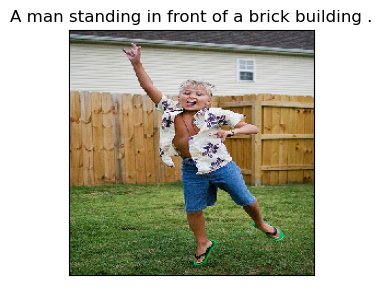

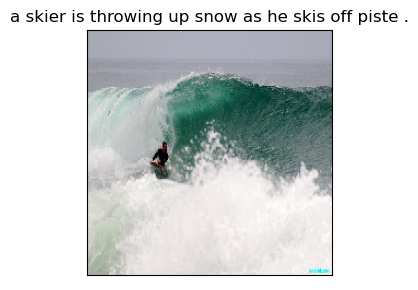

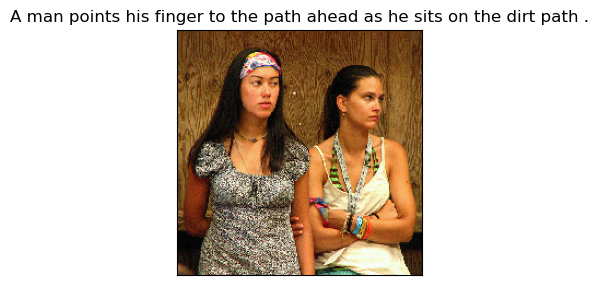

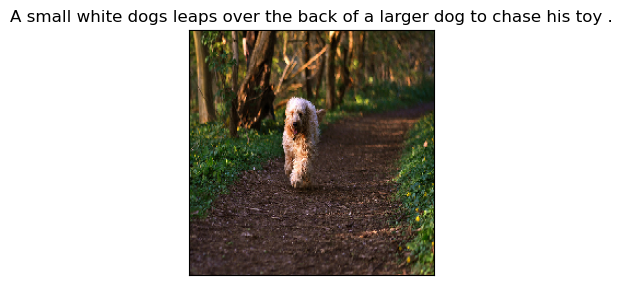

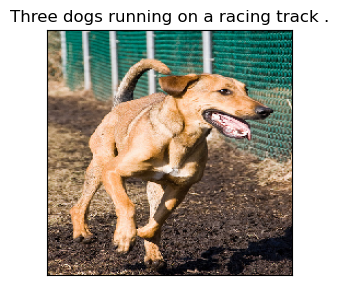

...

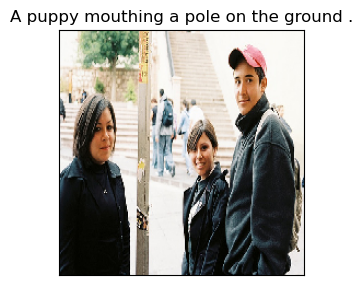

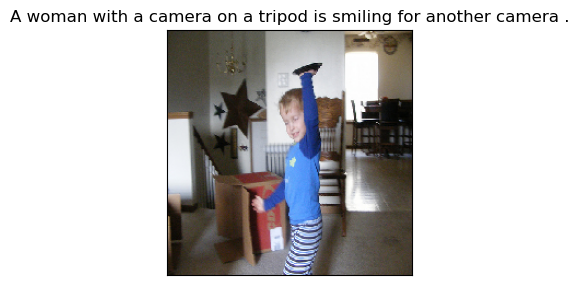

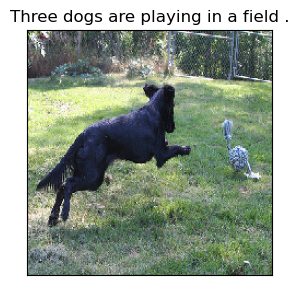

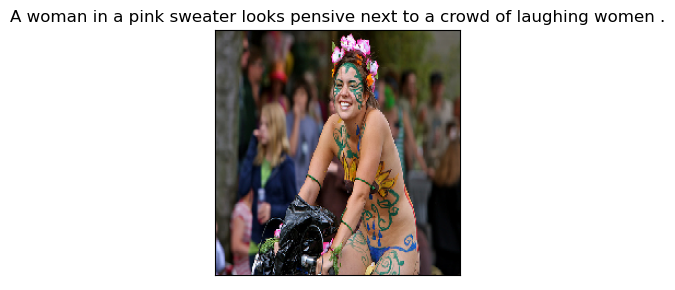

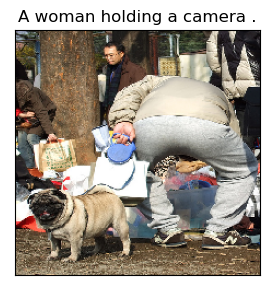

In [36]:
show_images(create_image_generator(train_filtered, "train_images"))

Где-то еще дети остались, но это связано с погрешностью описаний. 

In [37]:
# Объединение данных
all_data = train_filtered.merge(combined_df[['image', 'query_id', 'target_variable']], on=['image', 'query_id'], how='left')

In [38]:
all_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4316 entries, 0 to 4315
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            4316 non-null   object 
 1   query_id         4316 non-null   object 
 2   query_text       4316 non-null   object 
 3   target_variable  4225 non-null   float64
dtypes: float64(1), object(3)
memory usage: 168.6+ KB


In [39]:
all_data.dropna(inplace=True)

In [40]:
all_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4225 entries, 0 to 4315
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            4225 non-null   object 
 1   query_id         4225 non-null   object 
 2   query_text       4225 non-null   object 
 3   target_variable  4225 non-null   float64
dtypes: float64(1), object(3)
memory usage: 165.0+ KB


Вывод: отфильтровали, насколько это возможно по описанию, детские фотографии и сформировали отфильтрованный датасет с целевой переменной

## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

Напишем фунцию загрузки изображений и функцию векторизации

In [41]:
# Векторизация изображений
def get_image_dataflow(dataframe, img_path):
    img_data_gen = ImageDataGenerator(rescale=1./255)
    return img_data_gen.flow_from_dataframe(dataframe=dataframe,
                                             directory=img_path,
                                             x_col='image',
                                             y_col=None,
                                             target_size=(224, 224),
                                             batch_size=16,
                                             class_mode=None,
                                             seed=12345)

In [42]:
def build_resnet_model(input_shape=(224, 224, 3)):
    model = Sequential()
    model.add(ResNet50(input_shape=input_shape, weights='imagenet', include_top=False))
    model.add(GlobalAveragePooling2D())
    model.compile(optimizer=Adam(learning_rate=0.0001),
                  loss='mean_squared_error',
                  metrics=['mae'])
    return model

In [43]:
def extract_image_features(model, dataflow):
    features = []
    for _ in range(len(dataflow)):
        images = next(dataflow)
        predictions = model.predict(images)
        features.append(predictions)
    return np.concatenate(features)

In [44]:
train_dataflow = get_image_dataflow(all_data, "train_images")

Found 4225 validated image filenames.


In [45]:
image_features = extract_image_features(build_resnet_model(), train_dataflow)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 667ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 665ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 678ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 717ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 715ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 730ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 776ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 779ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 674ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 669ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 736ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 691ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 661ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 667ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 763ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 780ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 756ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 738ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 734ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 716ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 699ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 662ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 

In [46]:
image_features.shape

(4225, 2048)

Вывод: изображения из обучающей выборки векторизированы

## 4. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


In [47]:

nltk_stopwords = set(nltk_stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

In [48]:
def preprocess_text(text):
    text = re.sub(r"[^a-zA-Z]", ' ', text)  # Оставляем буквы
    text = ' '.join([word for word in word_tokenize(text) if word not in nltk_stopwords])
    return text.strip()

In [49]:
lemmatizer = WordNetLemmatizer()

def get_wordnet_pos(word):
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}
    return tag_dict.get(tag, wordnet.NOUN)

def lemmatiz(text):
    return " ".join([lemmatizer.lemmatize(w.lower(), get_wordnet_pos(w)) for w in nltk.word_tokenize(text)])

In [50]:
all_data['query_text'] = all_data['query_text'].apply(preprocess_text)

In [ ]:
all_data['query_text'] = all_data['query_text'].apply(lemmatiz)

In [ ]:
tfidf_vectorizer = TfidfVectorizer(stop_words=nltk_stopwords)
text_features = tfidf_vectorizer.fit_transform(all_data['query_text'])
text_features = text_features.toarray()

In [ ]:
print("Размер матрицы:", text_features.shape)

Размер матрицы: (4225, 956)


Вывод: Преобразованы текстовые описания фотографий в векторы с помощью метода TfidfVectorizer(). Перед этим мы провели предварительную обработку: очистили тексты от лишних символов и цифр, привели их к нижнему регистру, разбили на токены (слова), удалили стоп-слова и выполнили лемматизацию.

## 5. Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

Выполним объединение векторов изображений и текстов

In [ ]:

final_features = np.concatenate((image_features, text_features), axis=1)
target_variable = all_data['target_variable'].values

## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

In [ ]:
# Разделение на обучающую и тестовую выборки
group_labels = all_data['image']
gss = GroupShuffleSplit(n_splits=1, train_size=0.7, random_state=12345)

In [ ]:
train_idx, test_idx = next(gss.split(X=final_features, y=target_variable, groups=group_labels))
X_train, X_test = final_features[train_idx], final_features[test_idx]
y_train, y_test = target_variable[train_idx], target_variable[test_idx]

Сравним несколько моделей: линейную регрессию, Catboost и нейронную сеть Keras.

А сравнивать будем по метрике RMSE, так как ее проще интерпретировать

##### Линейная регрессия

In [ ]:

reg_model = LinearRegression()
reg_model.fit(X_train, y_train)

LinearRegression()

In [ ]:
y_pred = reg_model.predict(X_test)
rmse_value = mean_squared_error(y_test, y_pred, squared=False)  # RMSE
print(f'RMSE линейной регрессии: {rmse_value}')

RMSE линейной регрессии: 392263493.8161278


##### Catboost

In [59]:

catboost_model = CatBoostRegressor(verbose=0)
catboost_model.fit(X_train, y_train)

In [60]:
y_pred_cb = catboost_model.predict(X_test)
rmse_cb_value = mean_squared_error(y_test, y_pred_cb, squared=False)
print(f'RMSE CatBoost: {rmse_cb_value}')

RMSE CatBoost: 0.26342488992053525


##### Keras

Построим полносвязную нейросеть с помощью Keras

In [61]:


nn_model = Sequential()
nn_model.add(Input(shape=(X_train.shape[1],)))  
nn_model.add(Dense(512, activation='relu'))
nn_model.add(Dropout(0.3))  
nn_model.add(Dense(256, activation='relu'))
nn_model.add(Dropout(0.3))
nn_model.add(Dense(128, activation='relu'))
nn_model.add(Dropout(0.3))
nn_model.add(Dense(64, activation='relu'))
nn_model.add(Dense(1, activation='linear'))


optimizer = Adam(learning_rate=0.001)  
nn_model.compile(loss='mean_squared_error', optimizer=optimizer)


early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)


nn_model.fit(X_train, y_train, epochs=100, batch_size=16, 
             validation_data=(X_test, y_test), 
             callbacks=[early_stopping], verbose=2)

Epoch 1/100
185/185 - 4s - 22ms/step - loss: 0.0873 - val_loss: 0.0760
Epoch 2/100
185/185 - 2s - 11ms/step - loss: 0.0713 - val_loss: 0.0712
Epoch 3/100
185/185 - 2s - 10ms/step - loss: 0.0694 - val_loss: 0.0705
Epoch 4/100
185/185 - 2s - 10ms/step - loss: 0.0684 - val_loss: 0.0711
Epoch 5/100
185/185 - 2s - 11ms/step - loss: 0.0684 - val_loss: 0.0701
Epoch 6/100
185/185 - 2s - 11ms/step - loss: 0.0680 - val_loss: 0.0700
Epoch 7/100
185/185 - 2s - 10ms/step - loss: 0.0680 - val_loss: 0.0704
Epoch 8/100
185/185 - 2s - 10ms/step - loss: 0.0680 - val_loss: 0.0701
Epoch 9/100
185/185 - 2s - 11ms/step - loss: 0.0680 - val_loss: 0.0701
Epoch 10/100
185/185 - 2s - 13ms/step - loss: 0.0680 - val_loss: 0.0702
Epoch 11/100
185/185 - 2s - 12ms/step - loss: 0.0681 - val_loss: 0.0704
Epoch 12/100
185/185 - 2s - 12ms/step - loss: 0.0679 - val_loss: 0.0699
Epoch 13/100
185/185 - 2s - 11ms/step - loss: 0.0679 - val_loss: 0.0702
Epoch 14/100
185/185 - 2s - 11ms/step - loss: 0.0680 - val_loss: 0.0702
E

In [62]:

y_pred_nn = nn_model.predict(X_test)


rmse_nn_value = mean_squared_error(y_test, y_pred_nn, squared=False)
print(f'RMSE Neural Network: {rmse_nn_value}')

40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
RMSE Neural Network: 0.26444168001929913


Вывод: линейная регрессия не работает совсем. Catboost и Keras дали одинаковый примерно результат (RMSE 0.26), но у Catboost RMSE получился чуть меньше, возьмем его

## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

Напишем функции которые загрузят изображения и их векторизируют 

Затем создадим функцию, которая векторизирует текстовые описания. 

После этого объединим полученные векторы и получим предсказания от модели для тестового набора данных. 

Мы сформируем датафрейм, который будет содержать фотографии и соответствующие предсказания, и выведем на экран изображения. Если в текстовых описаниях будут слова, указывающие на наличие детей на фото, добавим алгоритм, который будет выводить сообщение: 'This image is unavailable in your country in compliance with local laws'

In [63]:


def load_images(df, path, batch_size=16):
    datagen = ImageDataGenerator(rescale=1./255)
    return datagen.flow_from_dataframe(
        dataframe=df,
        directory=path,
        x_col='image',
        y_col=None,
        target_size=(224, 224),
        batch_size=batch_size,
        class_mode=None,
        seed=12345
    )

def create_model(input_shape=(224, 224, 3)):
    model = Sequential([
        ResNet50(input_shape=input_shape, weights='imagenet', include_top=False),
        GlobalAveragePooling2D()
    ])
    model.compile(optimizer=Adam(learning_rate=0.0001), loss='mean_squared_error', metrics=['mae'])
    return model

def get_image_vectors(model, flow):
    predictions = [model.predict(next(flow)) for _ in range(len(flow))]
    return np.concatenate(predictions)



In [64]:
# Загружаем изображения тестовой выборки
test_images_flow = load_images(test_images_df, 'test_images')

# Получаем предсказания
predictions_test = get_image_vectors(create_model(), test_images_flow)

Found 100 validated image filenames.
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 734ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 705ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 690ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 752ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 805ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


In [65]:


def baby_word_stop(text, baby_terms):
    # Проверка на наличие терминов для детей в тексте
    for word in baby_terms:
        if word in text:
            return True
    return False  # Если ни одно слово не найдено, возвращаем False

def image_t(text) -> None:
    if baby_word_stop(text, baby_terms):
        print('-' * 100)
        print()
        print(text)
        print()
        string = 'This image is unavailable in your country in compliance with local laws'.upper()
        print(f'## \033[1m{string}\033[0m ##')
        print()
    else:
        processed_text = preprocess_text(text)
        # Лемматизация
        lemmatized_text = lemmatiz(processed_text)
        # Векторизация текста
        tfidf_text = tfidf_vectorizer.transform(pd.Series(lemmatized_text)).toarray()
        # Объединяем векторы изображений и текста
        combined_vectors = np.concatenate((predictions_test, np.resize(tfidf_text, (predictions_test.shape[0], 953))), axis=1)
         
        # Предсказываем вероятности
        pred_proba = catboost_model.predict(combined_vectors)
        d_f = pd.concat((test_images_df, pd.Series(np.reshape(pred_proba, (pred_proba.shape[0])), name='pred')), axis=1)
        image_name = list(d_f.sort_values(by='pred', ascending=False)['image'].head(10))
        pred_score = list(d_f.sort_values(by='pred', ascending=False)['pred'].head(10))

        print('')
        print('-' * 20, text, '-' * 20)
        print('')

        fig = plt.figure(figsize=(15, 5))
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5):  # Перебираем первые пять наиболее похожих изображений
            fig.add_subplot(1, 6, i + 1, title=round(pred_score[i], 5))
            image = Image.open(Path('test_images', image_name[i]))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        if text in list(test_queries_df['query_text']):
            plt.rcParams['axes.edgecolor'] = 'blue'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image = Image.open(Path('test_images', test_queries_df.iloc[test_queries_df[test_queries_df['query_text'] == text].index[0]]['image']))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        plt.show()

    return None



In [66]:
example = test_queries_df.sample(10)
text_test = list(example['query_text'])
text_test

['Two small white dogs chasing after a red ball .',
 "A little girl with a hat sits between a woman 's feet in the sand in front of a pair of colorful tents .",
 'The three children are standing on and by a fence .',
 'A black dog holds a small white dumbbell in its mouth .',
 'Woman with glasses working at a sewing machine .',
 'Four young people with cold drinks stand on the sidewalk in front of cartoon cutouts of the Simpsons also holding cold drinks .',
 'Two people are sitting on a wooden structure near a tree while conversing .',
 'A woman wearing jewelry holds a piece of paper and looks down .',
 'Two dogs stand in the brown grass .',
 'A bicyclist is jumping on ramp covered with graffiti .']


-------------------- Two small white dogs chasing after a red ball . --------------------



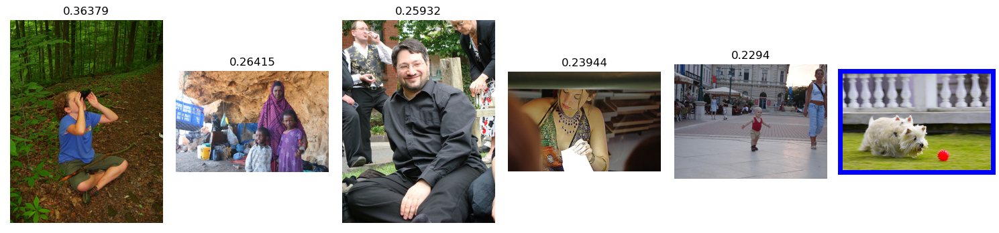

----------------------------------------------------------------------------------------------------

A little girl with a hat sits between a woman 's feet in the sand in front of a pair of colorful tents .

## THIS IMAGE IS UNAVAILABLE IN YOUR COUNTRY IN COMPLIANCE WITH LOCAL LAWS ##

----------------------------------------------------------------------------------------------------

The three children are standing on and by a fence .

## THIS IMAGE IS UNAVAILABLE IN YOUR COUNTRY IN COMPLIANCE WITH LOCAL LAWS ##


-------------------- A black dog holds a small white dumbbell in its mouth . --------------------



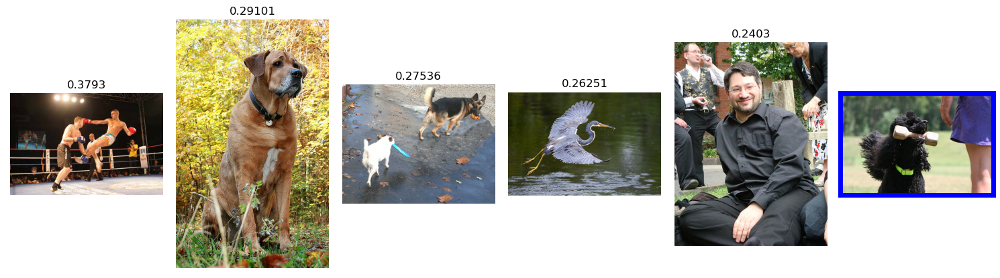


-------------------- Woman with glasses working at a sewing machine . --------------------



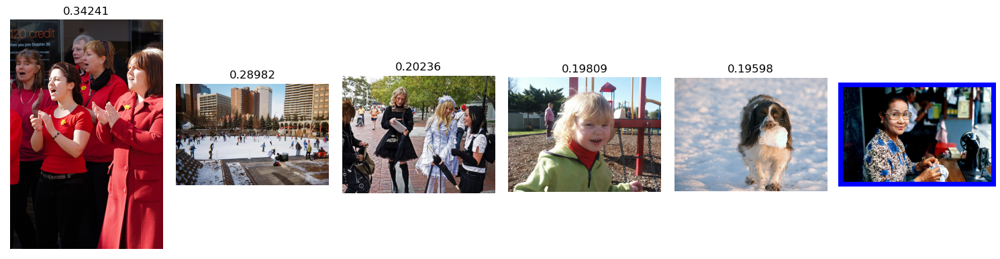


-------------------- Four young people with cold drinks stand on the sidewalk in front of cartoon cutouts of the Simpsons also holding cold drinks . --------------------



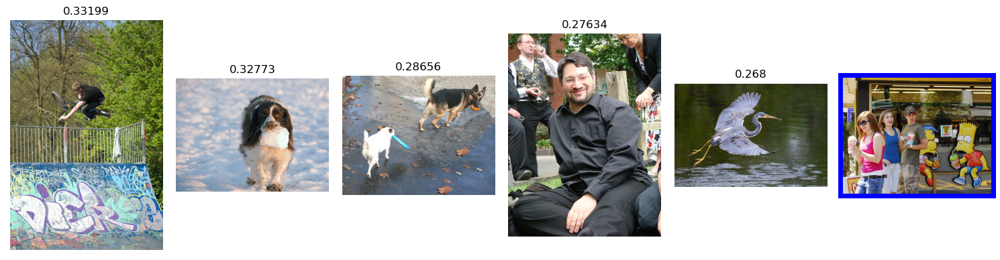


-------------------- Two people are sitting on a wooden structure near a tree while conversing . --------------------



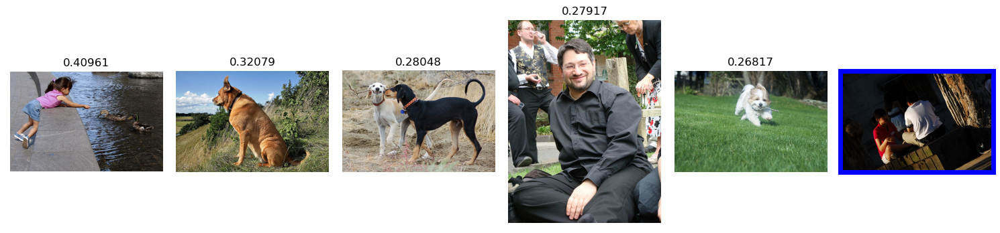


-------------------- A woman wearing jewelry holds a piece of paper and looks down . --------------------



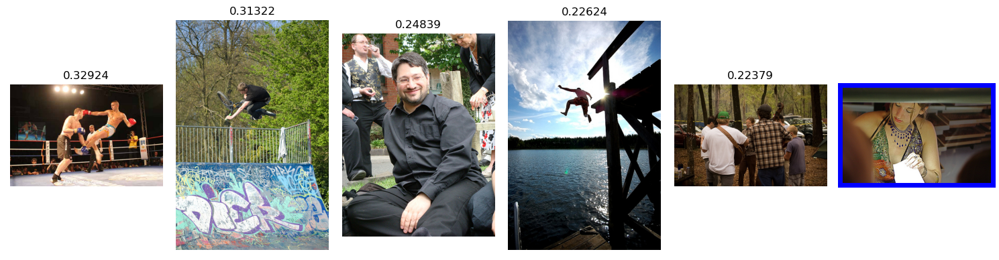


-------------------- Two dogs stand in the brown grass . --------------------



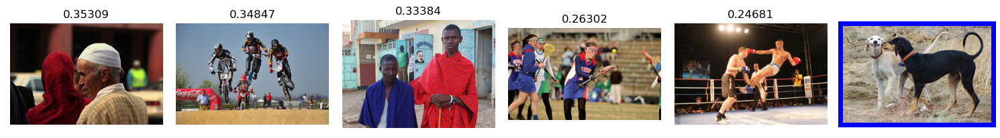


-------------------- A bicyclist is jumping on ramp covered with graffiti . --------------------



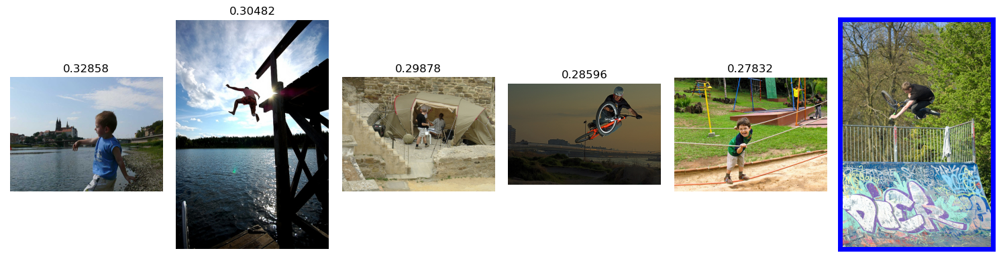

In [67]:
for text in text_test:
    image_t(text)

## 8. Выводы

В ходе проекта проделана следующая работа:
1. Проведен исследовательский анализ данных. Основной вывод - большинство (более 50%) картинок согласно как мнению экспертов, так и краудсорсинга - не соответствуют описанию
2. Отфильтрованы детские фотографии на основе описаний. У метода есть погрешность, так как очень часто картинки плохо соответствуют описанию
3. Оценки экспертов и краудсорсинга объединены в шкале от 0 до 1. Изображения и текст векторизированы. Таким образом получен датасет, где целевая переменная - агрегированная оценка экспертов и краудсорсинга, а признаки - объединенный вектор изображений и текстовых описаний.
4. Далее для того чтобы смоделировать вероятность соответствия текстового описания и картинки, мы протестировали алгоритмы: Линейную регрессию, Catboost и полносвязную нейросеть Keras. Линейная регрессия не сработала совсем, а Catboost и Keras дали примерно одинаковый результат: метрика RMSE (которую мы выбрали как более интерпретируемую) около 0.26.
5. Далее модель была проверена на тестовой выборке. Нельзя утверждать, что изображения полностью не соответствуют описанию: в них действительно присутствуют элементы, связанные с отдельными словами или сюжетами. Однако степень их соответствия в представленном наборе  низка.




- [x]  Jupyter Notebook открыт
- [ ]  Весь код выполняется без ошибок
- [ ]  Ячейки с кодом расположены в порядке исполнения
- [ ]  Исследовательский анализ данных выполнен
- [ ]  Проверены экспертные оценки и краудсорсинговые оценки
- [ ]  Из датасета исключены те объекты, которые выходят за рамки юридических ограничений
- [ ]  Изображения векторизованы
- [ ]  Текстовые запросы векторизованы
- [ ]  Данные корректно разбиты на тренировочную и тестовую выборки
- [ ]  Предложена метрика качества работы модели
- [ ]  Предложена модель схожести изображений и текстового запроса
- [ ]  Модель обучена
- [ ]  По итогам обучения модели сделаны выводы
- [ ]  Проведено тестирование работы модели
- [ ]  По итогам тестирования визуально сравнили качество поиска